# 3.EDA

In [9]:
import os
import pathlib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import folium
from folium.plugins import DualMap
from haversine import haversine
import seaborn as sns
import json
from shapely.geometry import Point

In [10]:
#Font
import matplotlib
from matplotlib import font_manager
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore")
matplotlib.rcParams['axes.unicode_minus']=False

font_fname = '/opt/app-root/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf/malgun.ttf'
font_family = font_manager.FontProperties(fname=font_fname).get_name()
plt.rcParams["font.family"] = font_family
sns.set(font=font_family)

In [11]:
path = pathlib.Path('./data')

In [12]:
fig_path = pathlib.Path('./figures')
if not fig_path.is_dir():
    fig_path.mkdir()

In [13]:
주정차단속 = pd.read_csv(os.path.join(path,'1.오산시_주정차단속(2018~2020).csv'),encoding="utf-8")
어린이교통사고_격자 = gpd.read_file(os.path.join(path,'2.오산시_어린이교통사고_격자.geojson'))
차량등록현황_격자 = gpd.read_file(os.path.join(path,'3.오산시_차량등록현황_격자.geojson'))
거주인구격자_총인구 = gpd.read_file(os.path.join(path,'4.오산시_연령별_거주인구격자(총인구).geojson'))
거주인구격자_유소년 = gpd.read_file(os.path.join(path,'5.오산시_연령별_거주인구격자(유소년).geojson'))
거주인구격자_생산가능 = gpd.read_file(os.path.join(path,'6.오산시_연령별_거주인구격자(생산가능인구).geojson'))
거주인구격자_고령 = gpd.read_file(os.path.join(path,'7.오산시_연령별_거주인구격자(고령).geojson'))
유동인구 = pd.read_csv(os.path.join(path,'8.오산시_유동인구(2019).csv'),encoding="utf-8")
어린이보호구역 = pd.read_csv(os.path.join(path,'9.오산시_어린이보호구역.csv'),encoding="utf-8")
학교위치정보 = pd.read_csv(os.path.join(path,'10.오산시_학교위치정보.csv'),encoding="utf-8")
초등학교_통학구 = gpd.read_file(os.path.join(path,'11.오산시_초등학교_통학구.geojson'))
중학교_학군 = gpd.read_file(os.path.join(path,'12.오산시_중학교_학군.geojson'))
어린이집_유치원현황 = pd.read_csv(os.path.join(path,'13.오산시_어린이집_유치원현황.csv'),encoding="utf-8")
기상데이터 = pd.read_csv(os.path.join(path,'14.오산시_기상데이터(2010~2019).csv'),encoding="utf-8")
무인교통단속카메라 = pd.read_csv(os.path.join(path,'15.오산시_무인교통단속카메라.csv'),encoding="utf-8")
도로안전표지 = pd.read_csv(os.path.join(path,'16.오산시_도로안전표지표준데이터.csv'),encoding="utf-8")
횡단보도 = gpd.read_file(os.path.join(path,'17.오산시_횡단보도.geojson'))
과속방지턱 = pd.read_csv(os.path.join(path,'18.오산시_과속방지턱표준데이터.csv'),encoding="utf-8")
신호등 = gpd.read_file(os.path.join(path,'19.오산시_신호등.geojson'))
CCTV설치현황 = pd.read_csv(os.path.join(path,'20.오산시_CCTV설치현황.csv'),encoding="utf-8")
인도 = gpd.read_file(os.path.join(path,'21.오산시_인도.geojson'))
버스정류장 = pd.read_csv(os.path.join(path,'22.오산시_버스정류장.csv'),encoding="utf-8")
상세도로망 = gpd.read_file(os.path.join(path,'23.오산시_상세도로망_LV6.geojson'))
시간대별_추정교통량 = pd.read_csv(os.path.join(path,'24.평일_전일,시간대별_오산시_추정교통량_Level6.csv'),encoding="utf-8")
혼잡빈도강도 = pd.read_csv(os.path.join(path,'25.평일_전일_오산시_혼잡빈도강도_Level6.csv'),encoding="utf-8")
혼잡시간강도 = pd.read_csv(os.path.join(path,'26.평일_전일_오산시_혼잡시간강도_Level6.csv'),encoding="utf-8")
도로명주소_건물 = gpd.read_file(os.path.join(path,'27.오산시_도로명주소_건물.geojson'))
건물연면적_격자 = gpd.read_file(os.path.join(path,'28.오산시_건물연면적_격자.geojson'))
체육시설현황 = pd.read_csv(os.path.join(path,'29.오산시_체육시설현황.csv'),encoding="utf-8")
학원_및_교습소_현황 = pd.read_csv(os.path.join(path,'30.오산시_학원_및_교습소_현황.csv'),encoding="utf-8")
법정경계_시군구 = gpd.read_file(os.path.join(path,'31.오산시_법정경계(시군구).geojson'))
행정경계_읍면동 = gpd.read_file(os.path.join(path,'32.오산시_행정경계(읍면동).geojson'))
법정경계_읍면동 = gpd.read_file(os.path.join(path,'33.오산시_법정경계(읍면동).geojson'))
지적도 = gpd.read_file(os.path.join(path,'34.오산시_지적도.geojson'))

관심학원_현황= pd.read_csv(os.path.join(path,'관심학원_현황.csv'),encoding="utf-8")
초등학교위치정보= pd.read_csv(os.path.join(path,'초등학교위치정보.csv'),encoding="utf-8")
평균유동인구= pd.read_csv(os.path.join(path,'평균유동인구.csv'),encoding="utf-8")

# 분석배경 EDA (외부데이터)

> ### TAAS(교통사고분석시스템) 제공 어린이 보행자 교통사고 연도별 발생 건수

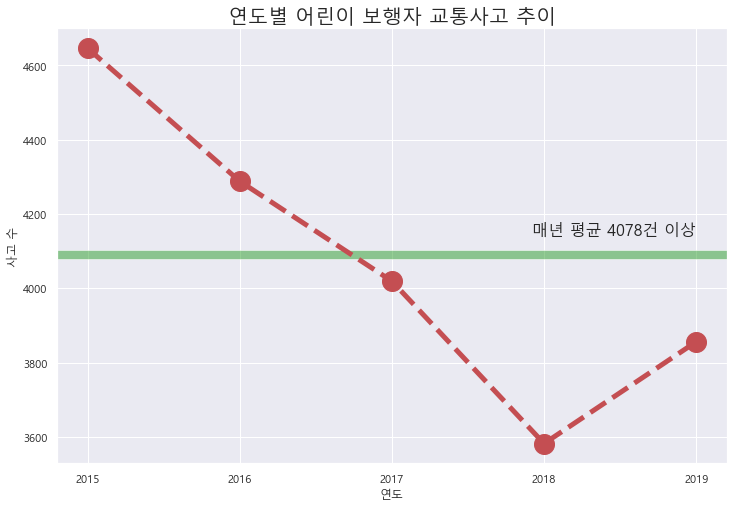

In [8]:
TAAS_어린이교통사고 = pd.read_excel("./files/어린이(만 13세 미만)보행자 교통사고.xls.xlsx",skiprows=[0,1])

mean = int(TAAS_어린이교통사고["사고건수(건)"].mean())
fig,ax = plt.subplots(figsize=(12,8))
ax.plot(TAAS_어린이교통사고["년도"].astype(str).unique().tolist(),
        TAAS_어린이교통사고["사고건수(건)"].values.tolist(),'r--',linewidth=5,marker="o",markersize=20)

ax.set_title("연도별 어린이 보행자 교통사고 추이",fontsize=20)
ax.axhspan(mean, mean+25, facecolor='#2ca02c', alpha=0.5)
ax.set_xlabel("연도")
ax.set_ylabel("사고 수")
ax.annotate(f'매년 평균 {mean}건 이상', (4, mean+100),fontsize=16,
            horizontalalignment='right', verticalalignment='top')

fig.savefig(os.path.join(fig_path,"TAAS제공_연도별_어린이_보행자_교통사고_추이.jpg"),dpi=fig.dpi)
plt.show()

In [15]:
print("오산시에서 지난 10년간 발생한 어린이 교통사고 건수 :",int(어린이교통사고_격자["accident_cnt"].sum()))

오산시에서 지난 10년간 발생한 어린이 교통사고 건수 : 537


`어린이 교통사고는 전국적으로 매년 4078건 이상 발생하고 있으며 오산시에도 지난 10년간 537건의 어린이 교통사고가 있었다.`

# 오산시 전반적 EDA

> ### 1.현재 어린이보호구역 선정 현황

> __전체 시설 중 어린이보후구역 지정 비율 현황__

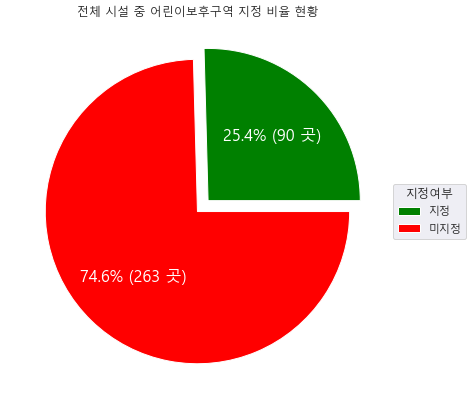

In [7]:
전체시설 = set(어린이집_유치원현황["시설명"].unique())
전체시설.update(set(초등학교위치정보["학교명"].unique()))
보호구역시설 = set(어린이보호구역["시설명"].unique())

fig, ax = plt.subplots(figsize=(15, 7), subplot_kw=dict(aspect="equal"))

labels = ["지정","미지정"]

sizes = [len(보호구역시설),len(전체시설-보호구역시설)]

def func(pct, allvals):
    absolute = int(pct/100.*np.sum(allvals))
    return "{:.1f}% ({:d} 곳)".format(pct, absolute)

wedges, texts, autotexts = ax.pie(sizes, autopct=lambda pct: func(pct, sizes),
                                  textprops=dict(color="w"),colors=["green","red"],explode=[0.1,0])
ax.legend(wedges, labels,
          title="지정여부",
          loc="center left",
          bbox_to_anchor=(1, 0, 0.5, 1))

plt.setp(autotexts, size=16, weight="bold")

ax.set_title("전체 시설 중 어린이보후구역 지정 비율 현황")
fig.savefig(os.path.join(fig_path,"전체 시설 중 어린이보후구역 지정 비율 현황.jpg"),dpi=fig.dpi)

plt.show()


`초등학교 , 유치원 , 어린이집 전체 시설 중 어린이 보호구역으로 지정된 시설 비율은 1/4 수준`

> __시설종류 별 분포__

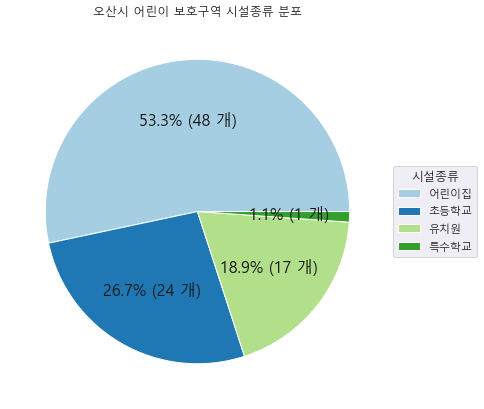

In [8]:
시설종류 = 어린이보호구역["시설종류"].value_counts()
fig, ax = plt.subplots(figsize=(15, 7), subplot_kw=dict(aspect="equal"))

labels = 시설종류.index.tolist()

sizes = 시설종류.values.tolist()

def func(pct, allvals):
    absolute = int(pct/100.*np.sum(allvals))
    return "{:.1f}% ({:d} 개)".format(pct, absolute)

colors_ = sns.color_palette('Paired',시설종류.shape[0])
wedges, texts, autotexts = ax.pie(sizes, autopct=lambda pct: func(pct, sizes),
                                  textprops=dict(color="k"),colors=colors_)
ax.legend(wedges, labels,
          title="시설종류",
          loc="center left",
          bbox_to_anchor=(1, 0, 0.5, 1))

plt.setp(autotexts, size=16, weight="bold")

ax.set_title("오산시 어린이 보호구역 시설종류 분포")

plt.show()

`오산시 전체 어린이 보호구역 시설 중 어린이집의 비율이 절반 이상을 차지하고 있음`

> __오산시 동별 어린이보호구역 지정현황__

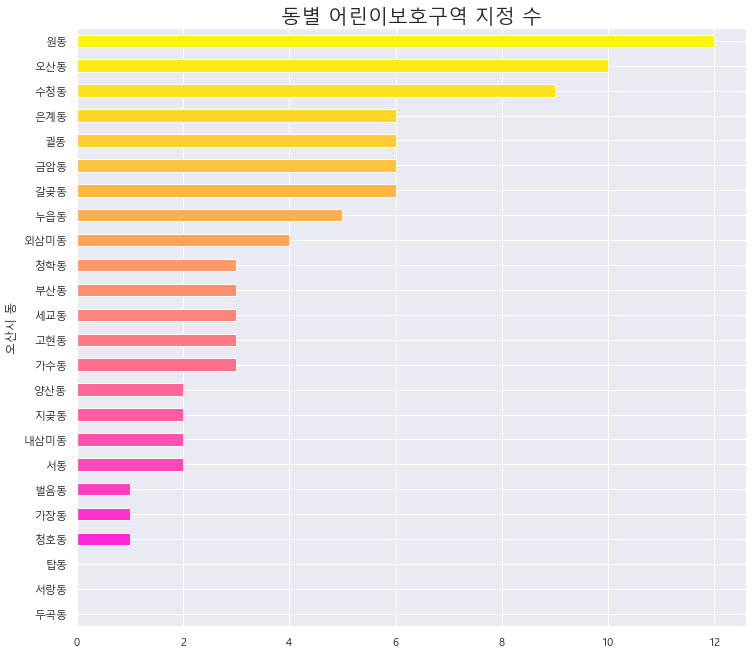

In [9]:
def cnt_kids_zone(geo_obj):
    global 어린이보호구역
    
    cnt=0
    for line in 어린이보호구역.iloc:
        
        [lng,lat] = line[-2:]
        if geo_obj.contains(Point(lng, lat)):
            cnt+=1
    return cnt

fig1, ax1 = plt.subplots()
colors_ = sns.color_palette('spring',법정경계_읍면동.shape[0])

동별_지정현황 = 법정경계_읍면동.copy()
동별_지정현황["보호구역 수"] = 법정경계_읍면동.geometry.map(cnt_kids_zone)
동별_지정현황.index = 법정경계_읍면동.EMD_KOR_NM
동별_지정현황.sort_values(by="보호구역 수")["보호구역 수"].plot(kind="barh",color=colors_,figsize=(12,11),ax=ax1)

ax1.set_title("동별 어린이보호구역 지정 수",fontsize=20)
ax1.set_ylabel("오산시 동")

plt.show()

`동 별 어린이 보호구역 지정 현황을 살펴본 결과 가장 많은 어린이 보호구역을 포함하는 세 동은 : 원동 - 오산동 - 수청동 순`

> __CCTV 설치 수 분포와 CCTV 설치 여부에 따른 보호구역 도로폭 차이__

In [10]:
CCTV_yes=어린이보호구역[어린이보호구역['CCTV설치여부']=='Y']
CCTV_no=어린이보호구역[어린이보호구역['CCTV설치여부']=='N']

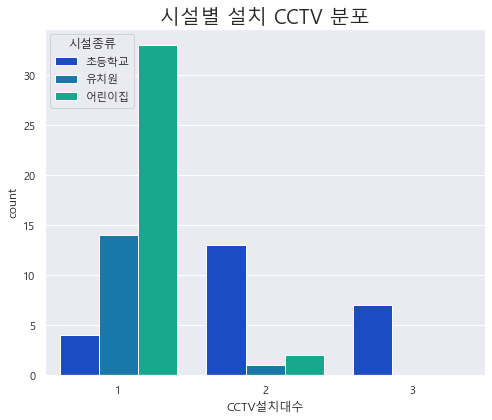

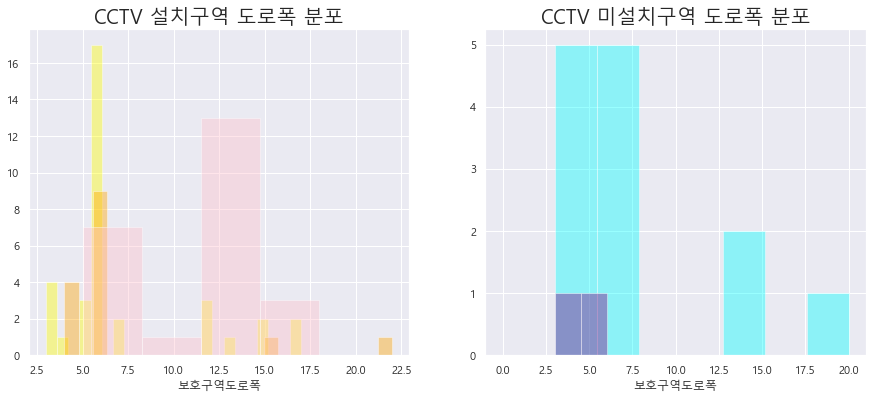

In [11]:
fig1, ax1 = plt.subplots(figsize=(7, 6))
fig2, (ax2 , ax3) = plt.subplots(ncols=2,figsize=(15, 6))

# 어린이보호구역 중 CCTV 설치가 되어있는 시설의 CCTV설치대수
sns.countplot(CCTV_yes['CCTV설치대수'], hue=CCTV_yes['시설종류'],ax=ax1,palette="winter")
ax1.set_title("시설별 설치 CCTV 분포",fontsize=20)
fig1.tight_layout()

# 어린이보호구역 중 CCTV 설치가 되어있는 시설의 보호구역도로폭
sns.distplot(CCTV_yes[CCTV_yes['시설종류']=='어린이집']['보호구역도로폭'], kde=False,ax=ax2,color="yellow")
sns.distplot(CCTV_yes[CCTV_yes['시설종류']=='유치원']['보호구역도로폭'], kde=False,ax=ax2,color="orange")
sns.distplot(CCTV_yes[CCTV_yes['시설종류']=='초등학교']['보호구역도로폭'], kde=False,ax=ax2,color="pink")
ax2.set_title("CCTV 설치구역 도로폭 분포",fontsize=20)

sns.distplot(CCTV_no[CCTV_no['시설종류']=='어린이집']['보호구역도로폭'], kde=False,ax=ax3,color="cyan")
sns.distplot(CCTV_no[CCTV_no['시설종류']=='유치원']['보호구역도로폭'], kde=False,ax=ax3,color="purple")
sns.distplot(CCTV_no[CCTV_no['시설종류']=='초등학교']['보호구역도로폭'], kde=False,ax=ax3,color="red")
ax3.set_title("CCTV 미설치구역 도로폭 분포",fontsize=20)

plt.show()

```보호구역 중 가장 큰 비율을 차지하는 어린이집의 경우 대부분 1대의 CCTV가 설치되어 있으며  
CCTV 설치 구역에 비해 미설치 구역의 도로폭이 더 좁은 경향이 있음을 확인할 수 있음```

> __반경 300m로 확인한 전체적인 어린이 보호구역 분포 현황__

In [12]:
center=[37.164584, 127.050451]
zoom =12.5

m = folium.Map(location=center, zoom_start=zoom)

folium.GeoJson(
    법정경계_읍면동,
    name = "동 경계",
    style_function=lambda feature: {
        'color': '#000000',
        'weight': 2,
        'opacity':0.2,
    }
).add_to(m)

for line in 어린이보호구역.iloc:
    [lng,lat] = line[-2:]
    
    folium.Circle(
    location = [lat,lng],
    radius=300,
    stroke=False,
    fill=True,
    fill_color='green',
    fill_opacity=0.6,
    tooltip=line["시설명"]).add_to(m)
    
folium.LayerControl().add_to(m)

m

```앞서 확인한 원동 , 오산동 , 수청동에 많은 원이 겹쳐있음을 확인 가능```

> ### 2. 오산시 인구분포 현황

> __Folium Choropleth 활용 연령별 거주인구 공간 시각화__

In [13]:
거주인구_전체 = 거주인구격자_총인구.copy()
거주인구_전체.rename(columns={"val":"총인구"},inplace=True)
거주인구_전체 = 거주인구_전체.merge(거주인구격자_유소년[["gid","val"]],on="gid")
거주인구_전체.rename(columns={"val":"유소년"},inplace=True)
거주인구_전체 = 거주인구_전체.merge(거주인구격자_생산가능[["gid","val"]],on="gid")
거주인구_전체.rename(columns={"val":"생산가능"},inplace=True)
거주인구_전체 = 거주인구_전체.merge(거주인구격자_고령[["gid","val"]],on="gid")
거주인구_전체.rename(columns={"val":"고령"},inplace=True)
거주인구_전체.head(3)

,gid,총인구,geometry,유소년,생산가능,고령
0,다사551085,0.0,"MULTIPOLYGON (((126.99422 37.17418, 126.99421 ...",0.0,0.0,0.0
1,다사551086,0.0,"MULTIPOLYGON (((126.99421 37.17508, 126.99420 ...",0.0,0.0,0.0
2,다사551087,0.0,"MULTIPOLYGON (((126.99420 37.17599, 126.99420 ...",0.0,0.0,0.0


In [14]:
center=[37.164584, 127.050451]
zoom =12.5
연령별_거주인구 = DualMap(location=center,zoom_start=zoom,tiles='cartodbdark_matter')

folium.GeoJson(
    법정경계_읍면동,
    name = "동 경계",
    style_function=lambda feature: {
        'color': '#ffffff',
        'weight': 2,
        'opacity':0.2,
    }
).add_to(연령별_거주인구)

folium.Choropleth(
    geo_data=거주인구_전체,
    name='총 거주인구',
    data=거주인구_전체,
    columns=('gid', '총인구'),
    key_on='feature.properties.gid',
    fill_color='YlOrRd',
    nan_fill_opacity=0,
    fill_opacity=1,
    line_color='gray',
    line_weight=0,
    legend_name='총 거주인구',
).add_to(연령별_거주인구.m1)

folium.Choropleth(
    geo_data=거주인구_전체,
    name='유소년 거주인구',
    data=거주인구_전체,
    columns=('gid', '유소년'),
    key_on='feature.properties.gid',
    fill_color='YlOrRd',
    nan_fill_opacity=0,
    fill_opacity=1,
    line_color='gray',
    line_weight=0,
    legend_name='유소년 거주인구',
).add_to(연령별_거주인구.m2)

folium.LayerControl(collapsed=False).add_to(연령별_거주인구)

연령별_거주인구

In [15]:
center=[37.164584, 127.050451]
zoom =12.5
연령별_거주인구2 = DualMap(location=center,zoom_start=zoom,tiles='cartodbdark_matter')

folium.GeoJson(
    법정경계_읍면동,
    name = "동 경계",
    style_function=lambda feature: {
        'color': '#ffffff',
        'weight': 2,
        'opacity':0.2,
    }
).add_to(연령별_거주인구2)

folium.Choropleth(
    geo_data=거주인구_전체,
    name='생산가능 거주인구',
    data=거주인구_전체,
    columns=('gid', '생산가능'),
    key_on='feature.properties.gid',
    fill_color='YlOrRd',
    nan_fill_opacity=0,
    fill_opacity=1,
    line_color='gray',
    line_weight=0,
    legend_name='생산가능 거주인구',
).add_to(연령별_거주인구2.m1)

folium.Choropleth(
    geo_data=거주인구_전체,
    name='고령 거주인구',
    data=거주인구_전체,
    columns=('gid', '고령'),
    key_on='feature.properties.gid',
    fill_color='YlOrRd',
    nan_fill_opacity=0,
    fill_opacity=1,
    line_color='gray',
    line_weight=0,
    legend_name='고령 거주인구',
).add_to(연령별_거주인구2.m2)

folium.LayerControl(collapsed=False).add_to(연령별_거주인구2)

연령별_거주인구2

`연령별로 밀집 거주지역이 조금씩 다르며 동별 밀집 정도를 확인해야할 필요성이 있음`

> __각 동에 따른 연령별 거주 인구 비교__

In [16]:
# 동별 총 인구수 분포
def ppl(geo_obj,col_name):
    global 거주인구_전체
    
    cnt=0
    for grid in 거주인구_전체[거주인구_전체[col_name]>0].iloc:
        if geo_obj.contains(grid.geometry.centroid):
            cnt+=grid[col_name]
    return cnt

동별_인구수 = 법정경계_읍면동.copy()
동별_인구수["총 인구"] = 동별_인구수.geometry.map(lambda x:ppl(x,"총인구"))
동별_인구수["유소년 인구"] = 동별_인구수.geometry.map(lambda x:ppl(x,"유소년"))
동별_인구수["생산가능 인구"] = 동별_인구수.geometry.map(lambda x:ppl(x,"생산가능"))
동별_인구수["고령 인구"] = 동별_인구수.geometry.map(lambda x:ppl(x,"고령"))
동별_인구수.head(3)

,EMD_CD,EMD_KOR_NM,geometry,총 인구,유소년 인구,생산가능 인구,고령 인구
0,41370101,오산동,"MULTIPOLYGON (((127.08320 37.16169, 127.08313 ...",20143.0,1892.0,14811.0,3275.0
1,41370102,부산동,"MULTIPOLYGON (((127.08334 37.16167, 127.08357 ...",19882.0,3782.0,14612.0,1406.0
2,41370103,원동,"MULTIPOLYGON (((127.07977 37.14891, 127.08002 ...",39401.0,5097.0,29994.0,4082.0


In [17]:
print("총 인구 기준 가장 거주인구가 많은 다섯 동 : ")
print(동별_인구수.sort_values(by="총 인구",ascending=False)["EMD_KOR_NM"][:5].values.tolist())
print()
print("유소년 인구 기준 가장 거주인구가 많은 다섯 동 : ")
print(동별_인구수.sort_values(by="유소년 인구",ascending=False)["EMD_KOR_NM"][:5].values.tolist())
print()
print("생산가능 인구 기준 가장 거주인구가 많은 다섯 동 : ")
print(동별_인구수.sort_values(by="생산가능 인구",ascending=False)["EMD_KOR_NM"][:5].values.tolist())
print()
print("고령 인구 기준 가장 거주인구가 많은 다섯 동 : ")
print(동별_인구수.sort_values(by="고령 인구",ascending=False)["EMD_KOR_NM"][:5].values.tolist())

총 인구 기준 가장 거주인구가 많은 다섯 동 : 
['원동', '금암동', '오산동', '부산동', '궐동']

유소년 인구 기준 가장 거주인구가 많은 다섯 동 : 
['원동', '금암동', '부산동', '내삼미동', '수청동']

생산가능 인구 기준 가장 거주인구가 많은 다섯 동 : 
['원동', '금암동', '궐동', '오산동', '부산동']

고령 인구 기준 가장 거주인구가 많은 다섯 동 : 
['원동', '오산동', '금암동', '수청동', '궐동']


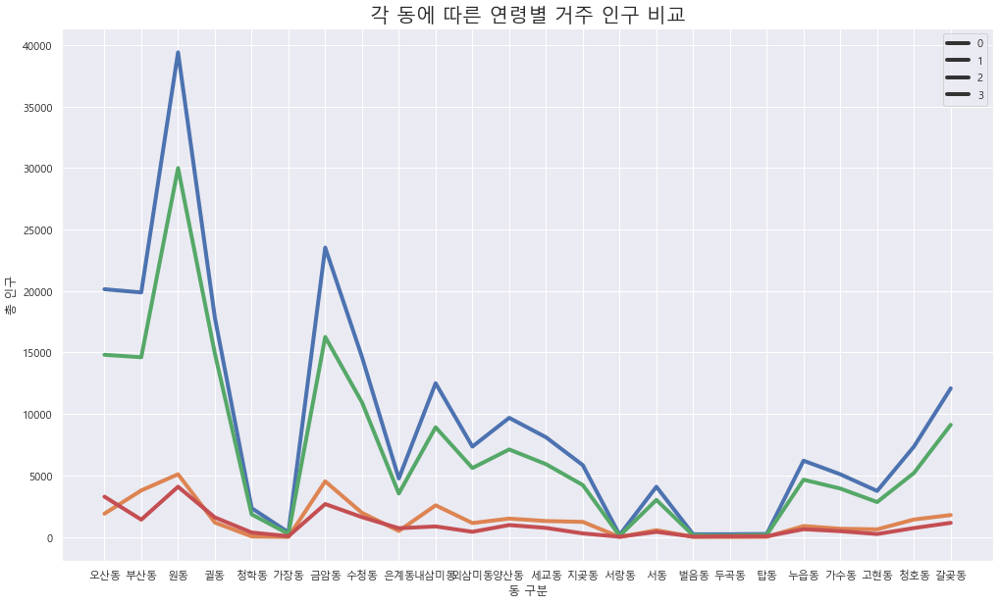

In [18]:
fig,ax_ = plt.subplots(figsize=(17,10))

line1 = sns.lineplot(data=동별_인구수,x="EMD_KOR_NM",y="총 인구",ax=ax_,size=0,sizes=[4])
line2 = sns.lineplot(data=동별_인구수,x="EMD_KOR_NM",y="유소년 인구",ax=ax_,size=1,sizes=[4])
line3 = sns.lineplot(data=동별_인구수,x="EMD_KOR_NM",y="생산가능 인구",ax=ax_,size=2,sizes=[4])
line4 = sns.lineplot(data=동별_인구수,x="EMD_KOR_NM",y="고령 인구",ax=ax_,size=3,sizes=[4])
ax_.legend((line1, line2, line3, line4), ('label1', 'label2', 'label3', 'label4'))
ax_.legend()
ax_.set_xlabel("동 구분")
ax_.set_title("각 동에 따른 연령별 거주 인구 비교",fontsize=20)
plt.show()

`총 인구 수치에 생산가능 인구의 영향이 큰 것을 확인할 수 있음 모델링 시 연령별 인구 정보를 개별 칼럼화가 필요`

> ### 3. 오산시 교통흐름 및 유동인구

> ### 4. CCTV 설치 및 주정차단속 현황

> __각 동에 따른 주정차 단속 수 비교 및 시각화__

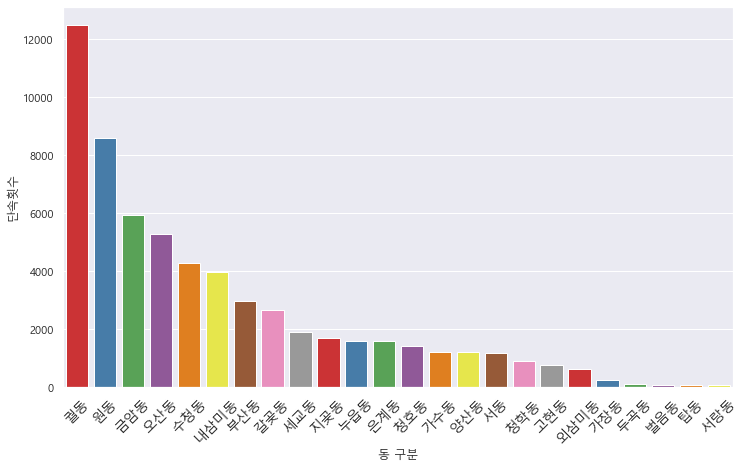

In [19]:
주정차단속['동 구분'] = 주정차단속['행정구역'].str.extract('(\w*동)')
traffic_check = 주정차단속['동 구분'].value_counts().to_frame()
traffic_check = traffic_check.reset_index()
traffic_check.columns = ['EMD_KOR_NM', '단속횟수']
plt.figure(figsize=(12,7))
sns.barplot(x='EMD_KOR_NM',y='단속횟수',data=traffic_check, palette='Set1')
plt.xticks(rotation=45,size=14)
plt.xlabel("동 구분")
plt.show()

In [20]:
center=[37.164584, 127.050451]
zoom =12.5

동별주정차단속 = folium.Map(location=center, zoom_start=zoom)

folium.Choropleth(
    geo_data=법정경계_읍면동,
    data=traffic_check,
    columns=('EMD_KOR_NM','단속횟수'),
    key_on='feature.properties.EMD_KOR_NM',
    fill_color='YlGnBu',
    legend_name='주정차단속',
).add_to(동별주정차단속)

top3 = traffic_check.sort_values(by="단속횟수",ascending=False)["EMD_KOR_NM"][:3].values.tolist()

for name in top3:
    for line in 법정경계_읍면동.iloc:
        if line["EMD_KOR_NM"]==name:
            folium.Marker(
                location=line.geometry.centroid.coords[0][::-1],
                popup=name,
                icon=folium.Icon(color="red",icon='car',prefix="fa")
            ).add_to(동별주정차단속)
        
동별주정차단속

`주정차 단속의 경우 총 인구수와 비례하는 것을 확인. 궐동-원동-금암동 순으로 주정차 단속 건수가 많다.`

> __어린이 보호구역 내부로 제한했을 때 동별 주정차 단속 수 비교 및 시각화__

In [21]:
school = 주정차단속[주정차단속.스쿨존여부 =='Y']
traffic_check_sc =  school["동 구분"].value_counts().to_frame()
traffic_check_sc = traffic_check_sc.reset_index()
traffic_check_sc.columns = ['EMD_KOR_NM', '단속횟수']

In [22]:
center=[37.164584, 127.050451]
zoom =12.5

보호구역동별주정차단속 = folium.Map(location=center, zoom_start=zoom)

folium.Choropleth(
    geo_data=법정경계_읍면동,
    data=traffic_check_sc,
    columns=('EMD_KOR_NM','단속횟수'),
    key_on='feature.properties.EMD_KOR_NM',
    fill_color='YlGnBu',
    legend_name='주정차단속',
).add_to(보호구역동별주정차단속)

top3 = traffic_check_sc.sort_values(by="단속횟수",ascending=False)["EMD_KOR_NM"][:3].values.tolist()

for name in top3:
    for line in 법정경계_읍면동.iloc:
        if line["EMD_KOR_NM"]==name:
            folium.Marker(
                location=line.geometry.centroid.coords[0][::-1],
                popup=name,
                icon=folium.Icon(color="red",icon='car',prefix="fa")
            ).add_to(보호구역동별주정차단속)
        
보호구역동별주정차단속

`스쿨존 내부에서 발생했음을 조건으로 제한 시 가수동에서 다수의 주정차 단속이 있었음을 확인`

> __어린이 보호구역 주변 유형별 CCTV 분포__

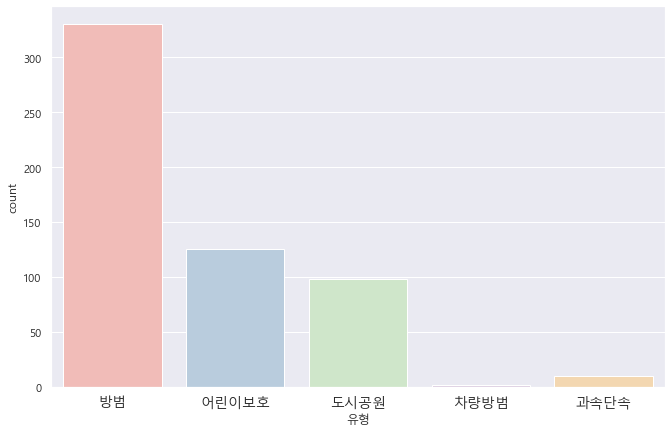

In [23]:
CCTV설치현황["유형"] = CCTV설치현황["CCTV 유형코드"].map({"A":"방범","B":"도시공원","C":"어린이보호","D":"차량방범","E":"과속단속"})

plt.figure(figsize=(11,7))
sns.countplot(x='유형',data=CCTV설치현황, palette='Pastel1')
plt.xticks(size=14)
plt.show()

`대부분의 경우 A(방범) , C(어린이보호) 목적의 CCTV임을 확인할 수 있다.`

In [24]:
center=[37.164584, 127.050451]
zoom =12.5

어린이보호구역_주변_유형별_CCTV분포 = folium.Map(location=center, zoom_start=zoom)

folium.GeoJson(
    법정경계_읍면동,
    style_function=lambda feature: {
        'fillColor': '#ADFF2F',
        'color': '#008000',
        'weight': 2,
    }
).add_to(어린이보호구역_주변_유형별_CCTV분포)

for i in 어린이보호구역.index:
    folium.Circle(
        location = 어린이보호구역.loc[i, ['보호구역_위도', '보호구역_경도']],
        radius = 300,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.85,
        tooltip = 어린이보호구역.loc[i,'시설명']
    ).add_to(어린이보호구역_주변_유형별_CCTV분포)

    
for i in CCTV설치현황.index:
    folium.Circle(
        location = CCTV설치현황.loc[i, ['설치위치_위도', '설치위치_경도']],
        radius = 50,
        fill=True,
        stroke=False,
        fill_color='red',
        fill_opacity=0.5,
        tooltip = CCTV설치현황.loc[i,'유형'],
    ).add_to(어린이보호구역_주변_유형별_CCTV분포)

어린이보호구역_주변_유형별_CCTV분포

`설치된 CCTV의 대다수가 어린이 보호구역을 기준으로 목적에 맞게 설치되어 있음을 확인할 수 있다.`

# 과제별 세부 EDA : 과제1

"교차로" , 사고횟수 3회이상 / 5회이상 / 7회이상/ 10회 비교시, 사고가 빈번한곳일수록 도로의 크기(폭)가 커진다.   
==> 보여줄 수치는 없으니 그림으로는 가능해 보임

# 과제별 세부 EDA : 과제2